<a href="https://colab.research.google.com/github/Murcha1990/ML_AI25/blob/main/Hometasks/Pro/AI_HW1_Regression_with_inference_pro.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Домашнее задание №1 (pro). Часть 1**

В этом домашнем задании (его первой части) вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;


> Оценка за первую часть домашки = $min(\text{ваш балл}, 7)$



**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [ ]:
!pip3 install ydata_profiling

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns
from ydata_profiling import ProfileReport
import warnings
import logging

warnings.filterwarnings('ignore')
random.seed(42)
np.random.seed(42)

In [2]:
logging.getLogger().setLevel(logging.WARNING)
warnings.filterwarnings('ignore')
sns.set_palette('bright')


pd.options.display.float_format = "{:.2f}".format
pd.options.display.max_rows = 100
pd.options.display.max_columns = 100

In [3]:
%matplotlib inline

### **Задание 0**
Давайте зафиксируем важный момент.

**Задание 0 (0 баллов).**
Изучите и ответье на вопрос: для чего фиксируем сиды в домашках?

`Your answer here` Сиды фиксируем для воспроизводимости результатов

# **Часть 1 | EDA**


Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (1.7 балла)
- Визуализации признаков и их анализ (1.6 балл)

Всего можно набрать 3.3 основных балла и 0.25 бонусных.

В следующих частях, вы увидите бонусные задания. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (1.7 балла)**

In [4]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


# Предварительно конктатим данные

In [5]:
df_train['sample_type'] = 'TRAIN'
df_test['sample_type'] = 'TEST'

data = pd.concat([df_train, df_test], axis=0)

del df_train['sample_type']
del df_test['sample_type']

TRAIN_MASK = (data['sample_type'] == 'TRAIN')
TEST_MASK = (data['sample_type'] == 'TEST')

In [6]:
data.shape

(7999, 14)

### **Задание 1.(0.4 балла)**
Выполните операции, направленные на базовое исследование данных:

- [ ] Посмотрите, есть ли в датасете пропуски и дубликаты. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [ ] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)
- [ ] Постройте дашборд в одну строку, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)(0.15 балла)
- [ ] Опишите базовые выводы (какие — выберите сами), используя дашборд (0.2 балла).

In [7]:
# Кол-во пропусков
data.groupby('sample_type').apply(lambda x: x.isna().sum()).T

sample_type,TEST,TRAIN
name,0,0
year,0,0
selling_price,0,0
km_driven,0,0
fuel,0,0
seller_type,0,0
transmission,0,0
owner,0,0
mileage,19,202
engine,19,202


In [8]:
# Кол-во дубликатов
data.groupby('sample_type').apply(lambda x: x.duplicated().sum()).T

sample_type
TEST      62
TRAIN    985
dtype: int64

In [9]:
train_profile = ProfileReport(data.loc[TRAIN_MASK], title="YData Profiling Report")
test_profile = ProfileReport(data.loc[TEST_MASK], title="YData Profiling Report")

In [10]:
train_profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 14/14 [00:00<00:00, 881.21it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [11]:
test_profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 14/14 [00:00<00:00, 1208.14it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Ваш ответ здесь.**

Достаточно много пропущенных, количество дубликатов не так критично.

### **Задание 2 (0.2 балла)**
Проанализируйте статистики датасета.

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [ ] Сравните среднее и медиану внутри `train`, внутри `test` и между собой. О чём могут говорить результаты?
- [ ] Сделайте выводы по статистикам. Отсутсвие выводов равносильно по баллам невыполнению задания.

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

In [12]:
# Ваш код здесь
data.loc[TRAIN_MASK].describe(include='all')

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,sample_type
count,6999,6999.00,6999.00,6999.00,6999,6999,6999,6999,6797,6797,6803,6796,6797.00,6999
unique,1924,NaN,NaN,NaN,4,3,2,5,386,120,316,419,NaN,1
top,Maruti Swift Dzire VDI,NaN,NaN,NaN,Diesel,Individual,Manual,First Owner,18.9 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,NaN,TRAIN
freq,116,NaN,NaN,NaN,3793,5826,6095,4587,197,885,330,468,NaN,6999
mean,NaN,2013.82,639515.20,69584.62,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.42,NaN
std,NaN,4.05,808941.91,57724.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.97,NaN
min,NaN,1983.00,29999.00,1.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.00,NaN
25%,NaN,2011.00,254999.00,35000.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.00,NaN
50%,NaN,2015.00,450000.00,60000.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.00,NaN
75%,NaN,2017.00,675000.00,97000.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.00,NaN


In [13]:
data.loc[TEST_MASK].describe(include='all')

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,sample_type
count,1000,1000.00,1000.00,1000.00,1000,1000,1000,1000,981,981,981,981,981.00,1000
unique,621,NaN,NaN,NaN,4,3,2,5,237,88,182,226,NaN,1
top,Maruti Alto 800 LXI,NaN,NaN,NaN,Diesel,Individual,Manual,First Owner,18.6 kmpl,1248 CC,74 bhp,200Nm@ 1750rpm,NaN,TEST
freq,15,NaN,NaN,NaN,534,837,877,623,23,116,43,57,NaN,1000
mean,NaN,2013.68,617901.04,71393.34,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.41,NaN
std,NaN,4.01,758553.86,48486.22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.92,NaN
min,NaN,1995.00,31000.00,1303.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.00,NaN
25%,NaN,2011.00,250000.00,37000.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.00,NaN
50%,NaN,2014.00,434999.00,61500.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.00,NaN
75%,NaN,2017.00,670000.00,100000.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.00,NaN


Выводы - Данные TEST меняются не сильно относительно TRAIN, если судить по среднему и медиане

### **Задание 3 (0.2 балла)**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.01 балла)
- [ ] Отобразите такие объекты (0.01 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.01 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.01 балла)
- [ ] Подумайте, могут ли в данных быть другие скрытые дубли? Предложите, как их можно отлавливать. (0.16 балла)

P.S тут данные без подвоха, но выводы нам нужны.

In [14]:
X_train, x_test = df_train.drop(columns=['selling_price']), df_train['selling_price']

In [15]:
print('Кол-во дубликатов: ', X_train[X_train.duplicated()].shape[0])

Кол-во дубликатов:  1159


In [16]:
# Отображаем
X_train[X_train.duplicated()]

,name,year,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
254,Hyundai Grand i10 Sportz,2017,35000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,82 bhp,114Nm@ 4000rpm,5.00
258,Maruti Swift VXI,2012,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,85.8 bhp,114Nm@ 4000rpm,5.00
268,Maruti Swift Dzire VXI,2014,70000,Petrol,Individual,Manual,Second Owner,19.1 kmpl,1197 CC,85.8 bhp,114Nm@ 4000rpm,5.00
324,Jaguar XE 2016-2019 2.0L Diesel Prestige,2017,9000,Diesel,Dealer,Automatic,First Owner,13.6 kmpl,1999 CC,177 bhp,430Nm@ 1750-2500rpm,5.00
325,Lexus ES 300h,2019,20000,Petrol,Dealer,Automatic,First Owner,22.37 kmpl,2487 CC,214.56 bhp,202Nm@ 3600-5200rpm,5.00
...,...,...,...,...,...,...,...,...,...,...,...,...
6947,Chevrolet Spark 1.0 LS,2010,60000,Petrol,Individual,Manual,Second Owner,18.0 kmpl,995 CC,62 bhp,90.3Nm@ 4200rpm,5.00
6984,Ford Freestyle Titanium Plus Diesel BSIV,2018,24000,Diesel,Individual,Manual,First Owner,24.4 kmpl,1498 CC,98.63 bhp,215Nm@ 1750-3000rpm,5.00
6989,Maruti Swift Dzire VDI,2015,50000,Diesel,Individual,Manual,First Owner,26.59 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.00
6997,Tata Indigo CR4,2013,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.00


In [17]:
# Здесь же обновляем индекс строк
df_train = df_train.drop_duplicates(subset=X_train.columns, keep='first').reset_index(drop=True)

In [18]:
assert df_train.shape == (5840, 13)

<span style="color:orange">Ответ на вопрос:</span>

Могут ли еще быть дубли - да \
Например одна и та же марка машин может писаться по-разному \
Способ исправления - сопоставлять с диктом марок и использовать регулярные выражения

### **Задание 4 (0.3 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Предобработайте признак `torque` — разделите его на два: собственно `torque` и `max_torque_rpm`. Учтите единицы измерения


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.

In [19]:
data[['mileage', 'engine', 'max_power', 'torque']]

,mileage,engine,max_power,torque
0,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm
1,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm
2,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm
3,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)"
4,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm
...,...,...,...,...
995,19.81 kmpl,1086 CC,68.05 bhp,99.04Nm@ 4500rpm
996,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm
997,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm
998,20.36 kmpl,1197 CC,78.9 bhp,111.8Nm@ 4000rpm


In [20]:
import re

def extract_first_number(text):
    numbers = re.findall(r'\d+[.,]?\d*', str(text))
    # print(numbers)

    if numbers:
        if 'kgm' in text:
                return float(numbers[0]) * 9.807
        return float(numbers[0])

    return None

def extract_last_number(text):
    numbers = re.findall(r'\d+[.,]?\d*', str(text))
    return float(numbers[-1]) if numbers else None


In [21]:
# your code here
data['mileage'] = data['mileage'].str.replace('kmpl', '').str.replace('km/kg', '').astype(float)
data['engine'] = data['engine'].str.replace('CC', '').astype(float)
data['max_power'] = data['max_power'].str.replace('bhp', '').str.replace(' ', '').replace('', np.nan).astype(float)

In [22]:
# 1 kgm = 9.807 Nm

In [22]:
# Чистим
data["torque"] = data["torque"].str.lower()
data["torque"] = data["torque"].str.strip().str.replace(" ", "").str.replace(",", "")

In [23]:
# Применяем функцию к столбцу
data['max_torque_rpm'] = data['torque'].apply(extract_last_number).copy()
data['torque'] = data['torque'].apply(extract_first_number).copy()

In [24]:
data[['torque', 'max_torque_rpm']].head(4)

,torque,max_torque_rpm
0,190.00,2000.00
1,250.00,2500.00
2,219.68,2750.00
3,112.78,4500.00


### **Задание 5 (0.3 балла)**

На первом шаге мы обнаружили пропуски. Давайте избавимся от них.

**Задание:**
- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось.
- [ ] Почему стоит применять именно медиану. Могли ли мы применить среднее? Обоснуйте свое рассуждение.
- [ ] Как правильно считать медиану для заполнения? Выберите верное утверждение:
 - По тестовым свою, по тренировочным — свою
 - По тренировочным данным для `train` и `test`






<span style="color:orange">Медиану считает на трейне, чтобы не заглядывать в будущее</span>

In [25]:
medians = data.loc[TRAIN_MASK].select_dtypes(include=['number']).median()
data.fillna(medians, inplace=True)

In [26]:
# Кол-во пропусков
data.groupby('sample_type').apply(lambda x: x.isna().sum()).T

sample_type,TEST,TRAIN
name,0,0
year,0,0
selling_price,0,0
km_driven,0,0
fuel,0,0
seller_type,0,0
transmission,0,0
owner,0,0
mileage,0,0
engine,0,0


### **Задание 6 (0.2 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.
- [ ] Ответье на вопрос — почему (хоть мы этого и не делаем) ``seats``, возможно рассмотреть как категориальную переменную?

In [27]:
data['engine'] = data['engine'].astype(int)
data['seats'] = data['seats'].astype(int)

`Your answer here` - <span style="color:orange">Да, можно рассмотреть как категориальную, т.к столбец обычно принимает небольшой набор значений</span>

### **Задание 7 (0.1 балла)**

Снова вызовите метод describe и проанализируйте статистики.

**Ответье на вопрос:**
- [ ] Есть ли основания предполагать, что заполнение пропусков свдинуло наши распределения? Могло ли это вообще возникнуть?

In [28]:
data.loc[TRAIN_MASK].describe()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,6999.00,6999.00,6999.00,6999.00,6999.00,6999.00,6999.00,6999.00,6999.00
mean,2013.82,639515.20,69584.62,19.42,1452.26,91.23,180.99,5.41,3061.31
std,4.05,808941.91,57724.00,3.99,495.15,35.35,116.46,0.95,940.37
min,1983.00,29999.00,1.00,0.00,624.00,0.00,47.07,2.00,400.00
25%,2011.00,254999.00,35000.00,16.80,1197.00,68.05,113.00,5.00,2400.00
50%,2015.00,450000.00,60000.00,19.30,1248.00,82.00,170.00,5.00,3000.00
75%,2017.00,675000.00,97000.00,22.15,1582.00,100.60,205.00,5.00,4000.00
max,2020.00,10000000.00,2360457.00,42.00,3604.00,400.00,3726.66,14.00,21800.00


In [29]:
data.loc[TEST_MASK].describe()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,1000.00,1000.00,1000.00,1000.00,1000.00,1000.00,1000.00,1000.00,1000.00
mean,2013.68,617901.04,71393.34,19.34,1454.88,90.84,177.81,5.40,3078.46
std,4.01,758553.86,48486.22,3.95,522.00,34.89,103.71,0.91,903.50
min,1995.00,31000.00,1303.00,0.00,624.00,34.20,48.00,4.00,400.00
25%,2011.00,250000.00,37000.00,16.55,1197.00,69.00,111.70,5.00,2500.00
50%,2014.00,434999.00,61500.00,19.30,1248.00,82.42,170.00,5.00,3000.00
75%,2017.00,670000.00,100000.00,22.30,1582.00,102.00,205.00,5.00,4000.00
max,2020.00,6000000.00,375000.00,32.26,3604.00,280.00,1422.02,9.00,5200.00


`Your answer here` <span style="color:orange">Изменения незначительны. Да, распределение могло поменяться при большом кол-ве пропусков</span>

## **Визуализации и корреляция (1.6 балла + 0.25)**

Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 8 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

In [39]:
NUM_FEATURES = [col for col in data.select_dtypes(include=['number']).columns 
                if col not in ['selling_price']]
CAT_FEATURES = [col for col in data.select_dtypes(include=["object", "category"]).columns if col not in ['name', 'sample_type']]
FEATURES = NUM_FEATURES + CAT_FEATURES

Ответ: <span style="color:orange">Да, есть связь с целевой и признаки коррелируют</span>

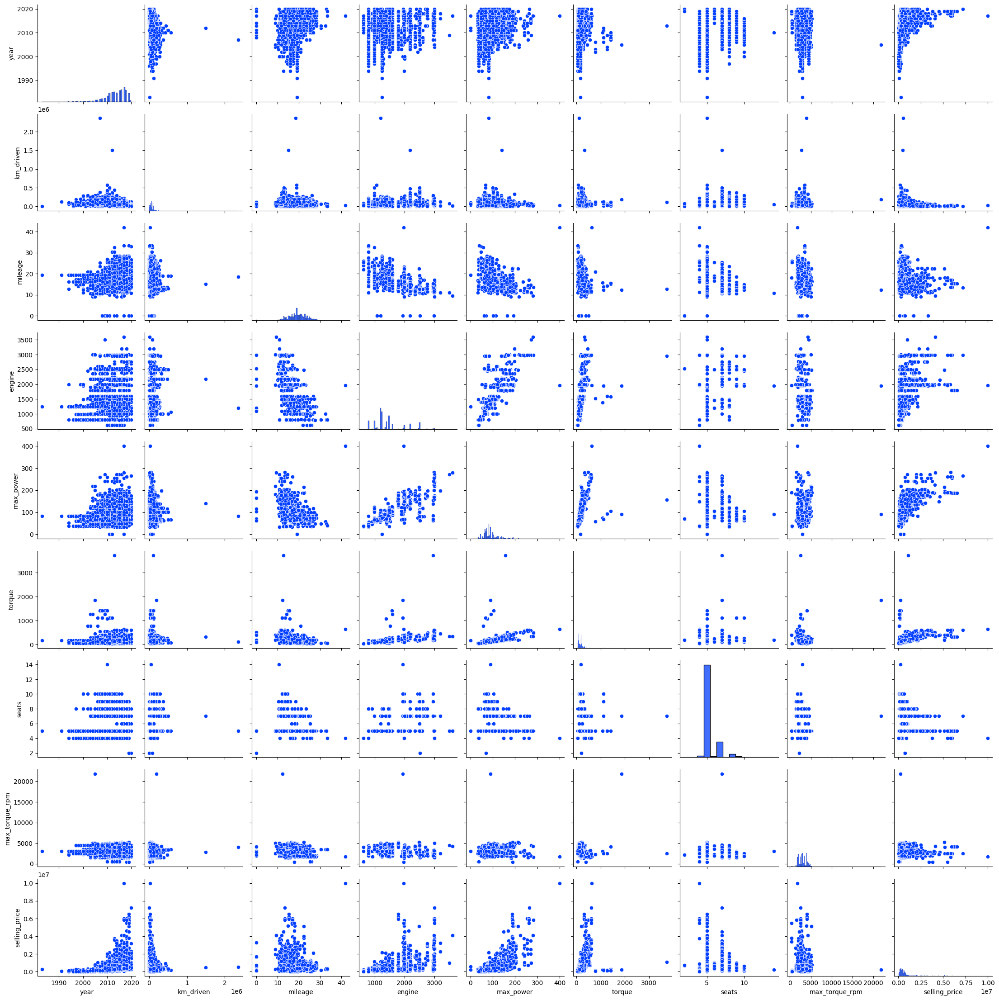

In [41]:
# your code here
sns.pairplot(data=data.loc[TRAIN_MASK][NUM_FEATURES + ['selling_price']])

path = r'./pics/pairplot.png'
plt.savefig(path)

Ответ: <span style="color:orange">Да, совокупности оказались похожими</span>

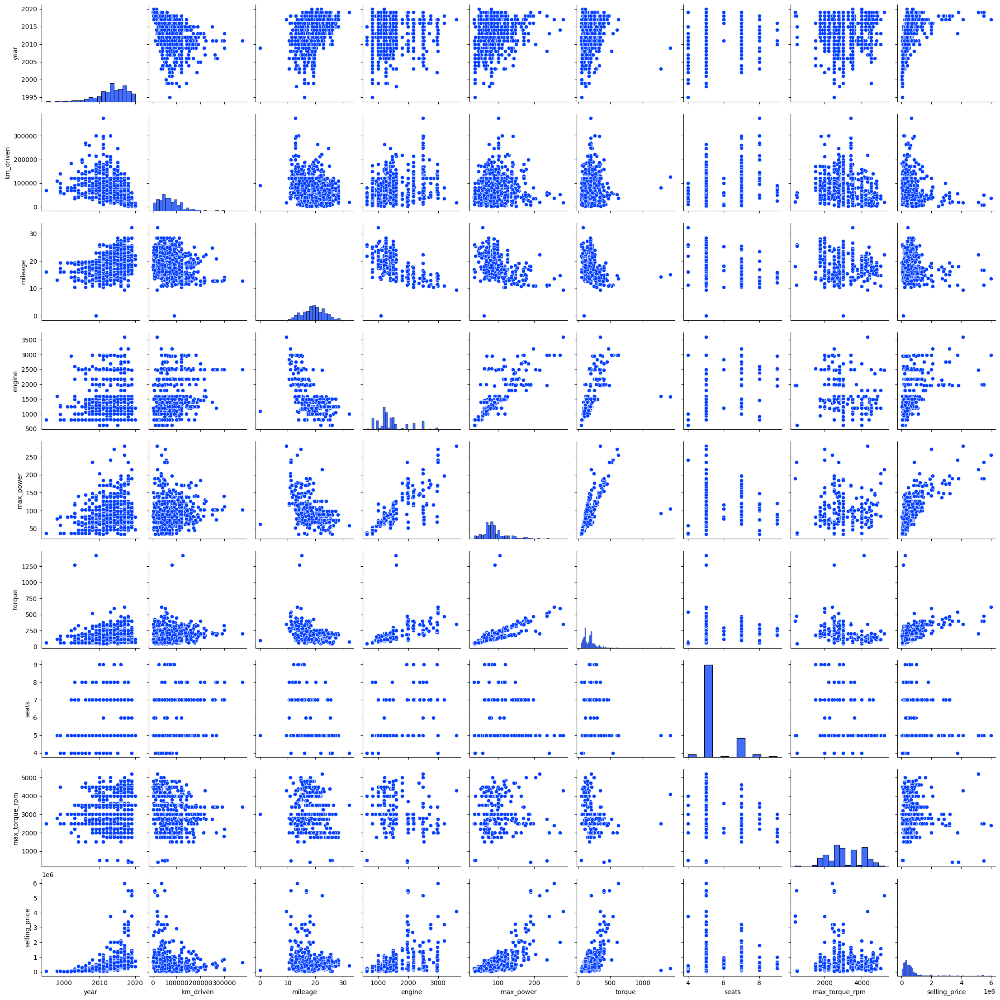

In [42]:
# your code here
sns.pairplot(data=data.loc[TEST_MASK][NUM_FEATURES + ['selling_price']])

### **Задание 9 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)

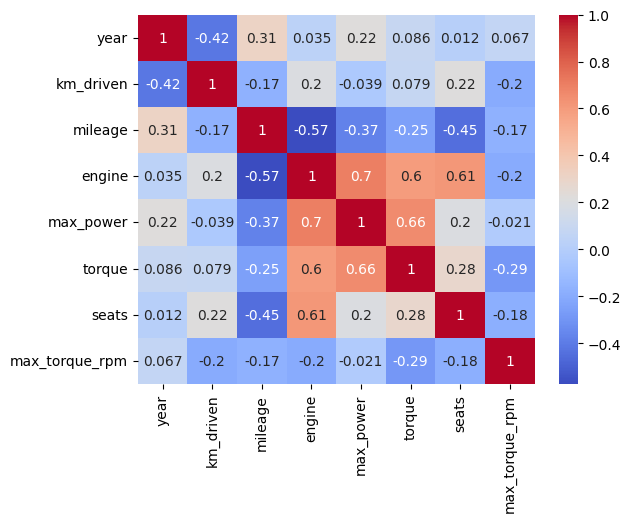

In [43]:
# your code here
sns.heatmap(data[NUM_FEATURES].corr(), annot=True, cmap='coolwarm')

path = r'./pics/base_corr.png'
plt.savefig(path)

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?
 - Изучите типы корреляций в `pd.corr()`. Какую вы использовали по умолчанию?

`Your answer here`:

2 наименее скорелированных признака - <span style="color:orange">year/seats</span> \
Сильная зависимость наблюдается между - <span style="color:orange">max_power/engine - 0.7</span> \
<span style="color:orange">Да, можно так утвержадть</span> \
<span style="color:orange">По умолчанию использовали Пирсона</span> 

### **Задание 10 (0.6 балла)**

По умолчанию `pd.corr` возвращает корреляцию Пирсона, говорящую о линейной взаимосвязи. Но зависимости существуют не только линейные! В этой задаче, попробуйте измерить другие способы вычисления корреляций.

- [ ] Реализуйте корреляцию Спирмена/Кендала (на выбор) без использования библиотек (можно пользоваться только `numpy`). Сравните результаты вычисления с библиотечной реализацией
- [ ] Сделайте выводы


Постройте матрицу корреляции [phik](https://pypi.org/project/phik/)
- [ ] Проинтерпретируйте результаты


$$
\rho = 1 - \frac{6 \sum_{i=1}^n d_i^2}{n(n^2 - 1)}
$$

**где:**
- $d_i = R_X(i) - R_Y(i)$ — разность рангов i-го объекта
- $R_X(i)$ — ранг i-го объекта по переменной X
- $R_Y(i)$ — ранг i-го объекта по переменной Y
- $n$ — количество наблюдений

In [44]:
x = [100, 10, 50, 30]
print(f"Массив: {x}") 
print(f"np.argsort(x): {np.argsort(x)}") 
print(f"Ранги: {np.argsort(np.argsort(x))}")  

Массив: [100, 10, 50, 30]
np.argsort(x): [1 3 2 0]
Ранги: [3 0 2 1]


In [45]:
# your code here
def spearman_correlation(x: pd.Series, y:pd.Series):

    rank_x = np.argsort(np.argsort(x)) + 1
    rank_y = np.argsort(np.argsort(y)) + 1

    d = (rank_x - rank_y)**2
    n = len(rank_x)

    return 1 - 6*(sum(d))/(n*(n**2 - 1))
    

In [46]:
from scipy.stats import spearmanr

In [47]:
print('Моя реализация: ', spearman_correlation(data.loc[TRAIN_MASK]['km_driven'], data.loc[TRAIN_MASK]['year']))
print('Библиотечная: ', spearmanr(data.loc[TRAIN_MASK]['km_driven'], data.loc[TRAIN_MASK]['year']))

Моя реализация:  -0.616556805220327
Библиотечная:  SignificanceResult(statistic=np.float64(-0.6203794774414525), pvalue=np.float64(0.0))


Ответ: <span style="color:orange">Реализация близка к библиотечной</span>

interval columns not set, guessing: ['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'seats', 'max_torque_rpm']


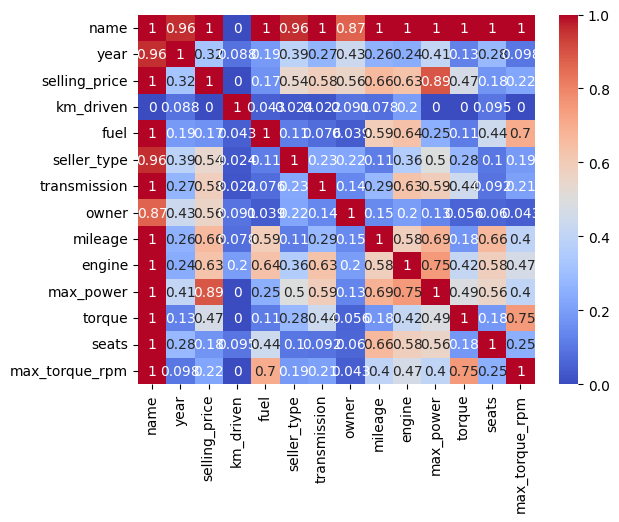

In [48]:
from phik import phik_matrix
sns.heatmap(data[TRAIN_MASK].phik_matrix(), annot=True, cmap='coolwarm')

path = r'./pics/phik_corr.png'
plt.savefig(path)

`Your answer here`\
phik подсвечивает примерно те же зависимости \
name странным образом коррелирует со многими переменными

### **Дополнительные визуализации (бонус 0.25 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их и поясните.
Один график: 0.125 балла, при условии, что он обоснован.

In [40]:
# your code here

# **Часть 2 (1.7 балла) | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.7 основных и 0.15 бонусных балла;

### **Задание 11 (0.05 балла)**

Сделайте на тренировочный и тестовый наборы. Она уже даны, достаточно просто отделить целевой признак. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных. Используйте уже имеющиеся данные train и test. Если считаете уместным применить какую-то более хитрую технику разбиения — примените, но опишите, зачем.

In [49]:
# И зачем я его сохраняю?
temp = data[NUM_FEATURES].copy()

Ответ: <span style="color:orange">Все нужное мне уже размечено, зачем плодить лишние строки</span>

In [50]:
# y_train = # your code here
# X_train = # your code here

In [51]:
# опишите выбранные вещественные признаки

In [52]:
# y_test = # your code here
# X_test = # your code here

### **Задание 12. (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [53]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE

# your code here|

model = LinearRegression()
model.fit(data.loc[TRAIN_MASK][NUM_FEATURES], data.loc[TRAIN_MASK]['selling_price'])

train_preds = model.predict(data.loc[TRAIN_MASK][NUM_FEATURES])
test_preds = model.predict(data.loc[TEST_MASK][NUM_FEATURES])

print(f'MSE_train: {MSE(data.loc[TRAIN_MASK]['selling_price'], train_preds):.15f}')
print(f'MSE_test: {MSE(data.loc[TEST_MASK]['selling_price'], test_preds):.15f}')

MSE_train: 230922980037.536041259765625
MSE_test: 193523497538.658813476562500


In [54]:
print(f'r2_train: {r2_score(data.loc[TRAIN_MASK]['selling_price'], train_preds):.15f}')
print(f'r2_test: {r2_score(data.loc[TEST_MASK]['selling_price'], test_preds):.15f}')

r2_train: 0.647065157904023
r2_test: 0.663337014766571


Ответ: <span style="color:orange">Модель могла бы быть и получше</span>

### **Задание 13 (0.15 балла)**

- [ ] Реализуйте $R^2$ руками. Приведите формулу $R^2$ и объясните каждую компоненту метрики

$$
R^2 = 1 - \frac{\frac{1}{n}\sum_{i=1}^n (y_i - \hat{y}_i)^2}{\frac{1}{n}\sum_{i=1}^n (y_i - \bar{y})^2} = 1 - \frac{MSE}{\text{Var}_{выб}(y)}
$$

**где:**
- $MSE = \frac{1}{n}\sum_{i=1}^n (y_i - \hat{y}_i)^2$ — средний квадрат ошибки модели
- $\text{Var}_{выб}(y) = \frac{1}{n}\sum_{i=1}^n (y_i - \bar{y})^2$ — выборочная дисперсия зависимой переменной
- $y_i$ — фактическое значение зависимой переменной
- $\hat{y}_i$ — предсказанное значение зависимой переменной
- $\bar{y} = \frac{1}{n}\sum_{i=1}^n y_i$ — среднее фактических значений
- $n$ — количество наблюдений

In [55]:
def r_2(y_true, y_pred):

    mse = np.mean((y_true - y_pred) ** 2)
    variance = np.mean((y_true - np.mean(y_true)) ** 2)
    r2 = 1 - mse / variance
    return r2

In [56]:
print(f'r2_train: {r_2(data.loc[TRAIN_MASK]['selling_price'], train_preds):.15f}')
print(f'r2_test: {r_2(data.loc[TEST_MASK]['selling_price'], test_preds):.15f}')

r2_train: 0.647065157904023
r2_test: 0.663337014766571


`Your answer here`

### **Бонус (0.15 балла)**

- [ ] Реализуйте [$\text{adjusted}-R^2$](https://en.wikipedia.org/wiki/Coefficient_of_determination).
- [ ] Объясните, когда применяется $\text{adjusted}-R^2$?

Скорректированный коэффициент детерминации (Adjusted R²) рассчитывается по формуле:

$$ \text{Adjusted } R^2 = 1 - \frac{(1 - R^2)(n - 1)}{n - k - 1} $$

где:
- $R^2$ — обычный коэффициент детерминации
- $n$ — число наблюдений (объем выборки)
- $k$ — число независимых переменных (предикторов) в модели **без учета свободного члена**
- $(n - k - 1)$ — число степеней свободы остаточной суммы квадратов

In [57]:
# your code here

def adj_r_2(y_true, y_pred, k):
    n = len(y_true)

    mse = np.mean((y_true - y_pred) ** 2)
    variance = np.mean((y_true - np.mean(y_true)) ** 2)
    r2 = 1 - mse / variance
    
    return 1 - (1 - r2) * (n - 1) / (n - k - 1)

In [58]:
print(f'r2_train: {adj_r_2(data.loc[TRAIN_MASK]['selling_price'], train_preds, len(NUM_FEATURES)):.15f}')
print(f'r2_test: {adj_r_2(data.loc[TEST_MASK]['selling_price'], test_preds, len(NUM_FEATURES)):.15f}')

r2_train: 0.646661226754271
r2_test: 0.660619251010903


`Your answer here` - <span style="color:orange">Когда хотим штрафовать за избыточное кол-во признаков</span>

### **Задание 14 (0.05 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [59]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', LinearRegression())
])

pipeline.fit(data.loc[TRAIN_MASK][NUM_FEATURES], data.loc[TRAIN_MASK]['selling_price'])

train_preds = pipeline.predict(data.loc[TRAIN_MASK][NUM_FEATURES])
test_preds = pipeline.predict(data.loc[TEST_MASK][NUM_FEATURES])

print(f'MSE_train: {MSE(data.loc[TRAIN_MASK]['selling_price'], train_preds):.15f}')
print(f'MSE_test: {MSE(data.loc[TEST_MASK]['selling_price'], test_preds):.15f}')
print()

print(f'r2_train: {r_2(data.loc[TRAIN_MASK]['selling_price'], train_preds):.15f}')
print(f'r2_test: {r_2(data.loc[TEST_MASK]['selling_price'], test_preds):.15f}')

MSE_train: 230922980037.536437988281250
MSE_test: 193523497538.658966064453125

r2_train: 0.647065157904023
r2_test: 0.663337014766571


In [60]:
# Коэффициенты из пайплайна 
model_from_pipeline = pipeline.named_steps['model']
coef_scaling = model_from_pipeline.coef_
intercept_scaling = model_from_pipeline.intercept_


coef_df_scaling = pd.DataFrame({
    'feature': NUM_FEATURES,
    'coef': coef_scaling
})

coef_df_scaling

,feature,coef
0,year,182306.75
1,km_driven,-82156.61
2,mileage,-3018.20
3,engine,17630.29
4,max_power,572652.85
5,torque,-20022.93
6,seats,-78900.35
7,max_torque_rpm,-91185.15


In [61]:
# Коэффициенты без масштабирования
coef_no_scaling = model.coef_
intercept_no_scaling = model.intercept_

coef_df_no_scaling = pd.DataFrame({
    'feature': NUM_FEATURES,
    'coef': coef_no_scaling
})

coef_df_no_scaling


,feature,coef
0,year,44982.85
1,km_driven,-1.42
2,mileage,-757.08
3,engine,35.61
4,max_power,16201.24
5,torque,-171.95
6,seats,-82683.98
7,max_torque_rpm,-96.97


<span style="color:orange">В общем: на качество стандартизация никак не влияет</span> \
<span style="color:orange">Действитетльно, стандартизация нужка для оценки важности или когда используем регуляризацию</span>

### **Задание 15 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [62]:
# your code here
# Коэффициенты из пайплайна 
model_from_pipeline = pipeline.named_steps['model']
coef_scaling = model_from_pipeline.coef_
intercept_scaling = model_from_pipeline.intercept_


coef_df_scaling = pd.DataFrame({
    'feature': NUM_FEATURES,
    'coef': abs(coef_scaling)
})

coef_df_scaling.sort_values(by='coef')

,feature,coef
2,mileage,3018.20
3,engine,17630.29
5,torque,20022.93
6,seats,78900.35
1,km_driven,82156.61
7,max_torque_rpm,91185.15
0,year,182306.75
4,max_power,572652.85


Наиболее информативный признак - <span style="color:orange">max_power</span>

### **Задание 16 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [108]:
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', Lasso())
])

pipeline.fit(data.loc[TRAIN_MASK][NUM_FEATURES], data.loc[TRAIN_MASK]['selling_price'])

train_preds = pipeline.predict(data.loc[TRAIN_MASK][NUM_FEATURES])
test_preds = pipeline.predict(data.loc[TEST_MASK][NUM_FEATURES])

print(f'MSE_train: {MSE(data.loc[TRAIN_MASK]['selling_price'], train_preds):.4f}')
print(f'MSE_test: {MSE(data.loc[TEST_MASK]['selling_price'], test_preds):.4f}')
print()

print(f'r2_train: {r_2(data.loc[TRAIN_MASK]['selling_price'], train_preds):.4f}')
print(f'r2_test: {r_2(data.loc[TEST_MASK]['selling_price'], test_preds):.4f}')

MSE_train: 230922980056.0683
MSE_test: 193523642309.9458

r2_train: 0.6471
r2_test: 0.6633


In [111]:
# your code here
# Коэффициенты из пайплайна 
model_from_pipeline = pipeline.named_steps['model']
coef_scaling = model_from_pipeline.coef_
intercept_scaling = model_from_pipeline.intercept_


coef_df_scaling = pd.DataFrame({
    'feature': NUM_FEATURES,
    'coef': abs(coef_scaling)
})

coef_df_scaling.sort_values(by='coef')

,feature,coef
2,mileage,3015.35
3,engine,17627.52
5,torque,20019.36
6,seats,78896.91
1,km_driven,82155.82
7,max_torque_rpm,91182.30
0,year,182304.90
4,max_power,572652.39


<span style="color:orange">Не занулила, наверное альфа маленький</span>

### **Задание 17. Финальный рывок (0.4 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Что значит каждый параметр `param_grid`, который вы заполняли для `GridSearch`? Опишите каждый
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [65]:
# your code here

from sklearn.model_selection import GridSearchCV, KFold
from sklearn.linear_model import ElasticNet

In [112]:
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', Lasso(random_state=42))
])

# сетка
param_grid = {
    'model__alpha': [0.0001, 0.001, 0.01, 0.1, 0.5, 1.0, 2.0, 5.0, 10.0, 50.0, 100.0, 200.0, 500.0],
    'model__max_iter': [100, 200, 300]
}

kfold = KFold(n_splits=10, shuffle=True, random_state=42)

grid_search = GridSearchCV(
    estimator=pipeline,
    param_grid=param_grid,
    cv=kfold,
    scoring='r2', 
    n_jobs=-1, 
    verbose=1,
    return_train_score=True
)

# Обучаем GridSearch

grid_search.fit(data.loc[TRAIN_MASK][NUM_FEATURES], 
                data.loc[TRAIN_MASK]['selling_price'])

Fitting 10 folds for each of 39 candidates, totalling 390 fits


,estimator,Pipeline(step...m_state=42))])
,param_grid,"{'model__alpha': [0.0001, 0.001, ...], 'model__max_iter': [100, 200, ...]}"
,scoring,'r2'
,n_jobs,-1
,refit,True
,cv,KFold(n_split... shuffle=True)
,verbose,1
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,True
,copy,True


In [113]:
# Лучшие параметры
best_params = grid_search.best_params_
print(f"Лучшие параметры: {best_params}")
print(f"Лучшая R^2 оценка: {grid_search.best_score_:.4f}")

results_df = pd.DataFrame(grid_search.cv_results_)
print(results_df[['params', 'mean_test_score', 'rank_test_score']].sort_values('rank_test_score').head())

Лучшие параметры: {'model__alpha': 500.0, 'model__max_iter': 100}
Лучшая R^2 оценка: 0.6397
                                             params  mean_test_score  \
38  {'model__alpha': 500.0, 'model__max_iter': 300}             0.64   
37  {'model__alpha': 500.0, 'model__max_iter': 200}             0.64   
36  {'model__alpha': 500.0, 'model__max_iter': 100}             0.64   
35  {'model__alpha': 200.0, 'model__max_iter': 300}             0.64   
34  {'model__alpha': 200.0, 'model__max_iter': 200}             0.64   

    rank_test_score  
38                1  
37                1  
36                1  
35                4  
34                4  


In [114]:
best_model = grid_search.best_estimator_

In [115]:
best_model

,steps,"[('scaler', ...), ('model', ...)]"
,transform_input,None
,memory,None
,verbose,False
,copy,True
,with_mean,True
,with_std,True
,alpha,500.0
,fit_intercept,True
,precompute,False
,copy_X,True


**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [116]:
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', ElasticNet(random_state=42))
])


param_grid = {
    'model__alpha': [0.0001, 0.001, 0.01, 0.1, 0.5, 1.0, 2.0, 5.0, 10.0, 50.0, 100.0, 200.0, 500.0],
    'model__max_iter': [100, 200, 300]
}

# Создаем GridSearchCV с 10-фолдовой кросс-валидацией
kfold = KFold(n_splits=10, shuffle=True, random_state=42)

grid_search = GridSearchCV(
    estimator=pipeline,
    param_grid=param_grid,
    cv=kfold,
    scoring='r2', 
    n_jobs=-1, 
    verbose=1,
    return_train_score=True
)

# Обучаем GridSearch

grid_search.fit(data.loc[TRAIN_MASK][NUM_FEATURES], 
                data.loc[TRAIN_MASK]['selling_price'])

Fitting 10 folds for each of 39 candidates, totalling 390 fits


,estimator,Pipeline(step...m_state=42))])
,param_grid,"{'model__alpha': [0.0001, 0.001, ...], 'model__max_iter': [100, 200, ...]}"
,scoring,'r2'
,n_jobs,-1
,refit,True
,cv,KFold(n_split... shuffle=True)
,verbose,1
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,True
,copy,True


In [117]:
# Лучшие параметры
best_params = grid_search.best_params_
print(f"Лучшие параметры: {best_params}")
print(f"Лучшая R^2 оценка: {grid_search.best_score_:.4f}")

results_df = pd.DataFrame(grid_search.cv_results_)
print(results_df[['params', 'mean_test_score', 'rank_test_score']].sort_values('rank_test_score').head())

Лучшие параметры: {'model__alpha': 0.01, 'model__max_iter': 100}
Лучшая R^2 оценка: 0.6398
                                            params  mean_test_score  \
6   {'model__alpha': 0.01, 'model__max_iter': 100}             0.64   
7   {'model__alpha': 0.01, 'model__max_iter': 200}             0.64   
8   {'model__alpha': 0.01, 'model__max_iter': 300}             0.64   
3  {'model__alpha': 0.001, 'model__max_iter': 100}             0.64   
4  {'model__alpha': 0.001, 'model__max_iter': 200}             0.64   

   rank_test_score  
6                1  
7                1  
8                1  
3                4  
4                4  


<span style="color:orange">Все комбинации дают приммерно одинаковое качество \
Обучалось 5 секунд</span>

### **Задание 18 (0.35 балла)**

И так, вы обучили все варианты регуляризаций, доступные в sklearn, но не все, что мы обсудили на занятии! И следующее задание о забытой - $L0$ регуляризации.


**Ваша задача:**>
- [ ] Реализуйте модель с $L0$-регуляризаицей.
- [ ] Обучите модель на данных и проанализируйте результат, экспериментируя с коэффициенитом регуляризации
- [ ] Проанализируйте результаты обучения

**Важно:**

Вопреки тому, что L0 не реализована в стандартных пакетах, концепция данной регуляризации не является мертвой. Она может встречаться в [статьях](https://arxiv.org/abs/1712.01312) и экспериментах.




$$
\|\beta\|_0 = \sum_{j=1}^{p} \mathbb{I}(\beta_j \neq 0) = \#\{j: \beta_j \neq 0\}
$$

где $p$ - количество признаков, $\mathbb{I}$ - индикаторная функция

Ключевая проблема L0: Она невыпуклая и NP-сложная для оптимизации. \
Перебрать все комбинации обнуленных весов на реальных данных практически невозможно. \
Поэтому на практике L0-регуляризация напрямую почти не используется.

In [71]:
# your code here

# Попросил сгенерить DeepSeek
class L0LinearRegressor:
    """L0 регуляризация через отбор признаков"""
    
    def __init__(self, max_features=5):
        self.max_features = max_features  # сколько признаков оставить
        self.coef_ = None
        self.selected_idx_ = None
    
    def fit(self, X, y):
        # 1. Ищем лучшие признаки по корреляции
        correlations = np.abs(np.corrcoef(X.T, y)[:-1, -1])
        
        # 2. Выбираем top-k признаков
        self.selected_idx_ = np.argsort(correlations)[-self.max_features:]
        
        # 3. Обучаем линейную регрессию только на них
        X_selected = X[:, self.selected_idx_]
        
        # Решение через нормальное уравнение
        X_with_bias = np.c_[np.ones(X_selected.shape[0]), X_selected]
        theta = np.linalg.pinv(X_with_bias.T @ X_with_bias) @ X_with_bias.T @ y
        
        # 4. Сохраняем коэффициенты
        self.coef_ = np.zeros(X.shape[1] + 1)  # +1 для intercept
        self.coef_[0] = theta[0]  # intercept
        self.coef_[1:][self.selected_idx_] = theta[1:]
        
        return self
    
    def predict(self, X):
        X_selected = X[:, self.selected_idx_]
        X_with_bias = np.c_[np.ones(X_selected.shape[0]), X_selected]
        return X_with_bias @ self.coef_[[0, *self.selected_idx_]]

In [72]:
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', L0LinearRegressor())
])

pipeline.fit(data.loc[TRAIN_MASK][NUM_FEATURES], data.loc[TRAIN_MASK]['selling_price'])

train_preds = pipeline.predict(data.loc[TRAIN_MASK][NUM_FEATURES])
test_preds = pipeline.predict(data.loc[TEST_MASK][NUM_FEATURES])

print(f'MSE_train: {MSE(data.loc[TRAIN_MASK]['selling_price'], train_preds):.4f}')
print(f'MSE_test: {MSE(data.loc[TEST_MASK]['selling_price'], test_preds):.4f}')
print()

print(f'r2_train: {r_2(data.loc[TRAIN_MASK]['selling_price'], train_preds):.4f}')
print(f'r2_test: {r_2(data.loc[TEST_MASK]['selling_price'], test_preds):.4f}')

MSE_train: 621859534503.2542
MSE_test: 500719374896.6879

r2_train: 0.0496
r2_test: 0.1289


# **Часть 3 (0.5 балла) | Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.5 основных балла.



### **Задание 19 (0.1 балла)**

Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

- [ ] Предобработайте столбец `name`, чтобы избежать его удаления

In [73]:
def clean_text_step_by_step(text):

    # Переводим в нижний регистр
    text = text.lower()
    # Заменяем русскую букву С на английскую
    text = text.replace(chr(1089), chr(99))
    # Оставляем только буквы (латинские, русские) и пробелы
    text = re.sub(r'[^a-zA-Zа-яА-ЯёЁ\s]', ' ', text)
    # Убираем лишние пробелы
    text = re.sub(r'\s+', ' ', text)

    # ПРОСТОЕ УДАЛЕНИЕ ДУБЛИКАТОВ СЛОВ
    words = text.split()
    unique_words = []
    for word in words:
        if word not in unique_words:  # сохраняет порядок
            unique_words.append(word)
    
    return ' '.join(unique_words).strip()

In [74]:
# data = data.copy()
data['name'] = data['name'].apply(clean_text_step_by_step)
data['name'] = data['name'].apply(lambda x: ' '.join(str(x).split()[:2]) if pd.notna(x) else '')

In [75]:
# assert X_train_cat.shape == (5840, 11)

In [76]:
# X_train_cat.describe(include='object')

### **Задание 20 (0.1 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования.

In [77]:
from tkinter.constants import ON
from sklearn.preprocessing import OneHotEncoder # или можно использовать get_dummies из библиотеки pandas

# your code here
# Просто запихну в пайплайн
one_hot = OneHotEncoder(handle_unknown='ignore')

### **Задание 21 (0.2 балла)**

OHE — базовый алгоритм преобразования категориальных признаков, но и с ним нужно быть аккуратными.

**Ответьте на вопросы:**


* Как корректно работать с OHE преобразованием?
* Почему мы удаляем один столбец?
* Пусть из $n$ признаков мы получили $n-1$ столбец, из которых $k < n -1$ оказались не важными по весам модели. Корректно ли их удалить?

`Your answer here`


1. Корректная работа с OHE: \
Тренировать преобразование только на обучающей выборке, затем применять те же категории/столбцы к валидации и тесту.

2. Зачем удаляем один столбец?
Чтобы избежать мультиколлинеарности.

3. Можно ли удалить k неважных столбцов?
Нет, нельзя просто удалить. Если категориальный признак закодирован в несколько бинарных столбцов, 
удалять нужно все столбцы этой категории или ни одного, иначе нарушится интерпретация признака.

### **Задание 22 (0.1 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [128]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
from sklearn.compose import ColumnTransformer

# your code here
one_hot = OneHotEncoder(handle_unknown='ignore')


preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(handle_unknown='ignore'), CAT_FEATURES),
        ('num', StandardScaler(), NUM_FEATURES)
    ],
    remainder='passthrough'  # остальные фичи пройдут без изменений
)


pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('model', Ridge())
])

# Определяем сетку параметров для перебора
param_grid = {
    'model__alpha': [0.0001, 0.001, 0.01, 0.1, 0.5, 1.0, 2.0, 5.0, 10.0, 50.0, 100.0, 200.0, 500.0],
    'model__max_iter': [100, 200, 300]
}

# Создаем GridSearchCV с 10-фолдовой кросс-валидацией
kfold = KFold(n_splits=10, shuffle=True, random_state=42)

grid_search = GridSearchCV(
    estimator=pipeline,
    param_grid=param_grid,
    cv=kfold,
    scoring='r2', 
    n_jobs=-1, 
    verbose=1,
    return_train_score=True
)

# Обучаем GridSearch

grid_search.fit(data.loc[TRAIN_MASK][FEATURES], 
                data.loc[TRAIN_MASK]['selling_price'])

Fitting 10 folds for each of 39 candidates, totalling 390 fits


,estimator,"Pipeline(step...l', Ridge())])"
,param_grid,"{'model__alpha': [0.0001, 0.001, ...], 'model__max_iter': [100, 200, ...]}"
,scoring,'r2'
,n_jobs,-1
,refit,True
,cv,KFold(n_split... shuffle=True)
,verbose,1
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,True
,transformers,"[('cat', ...), ('num', ...)]"


In [129]:
# Лучшие параметры
best_params = grid_search.best_params_
print(f"Лучшие параметры: {best_params}")
print(f"Лучшая R^2 оценка: {grid_search.best_score_:.4f}")

results_df = pd.DataFrame(grid_search.cv_results_)
print(results_df[['params', 'mean_test_score', 'rank_test_score']].sort_values('rank_test_score').head())

Лучшие параметры: {'model__alpha': 2.0, 'model__max_iter': 100}
Лучшая R^2 оценка: 0.6871
                                           params  mean_test_score  \
19  {'model__alpha': 2.0, 'model__max_iter': 200}             0.69   
20  {'model__alpha': 2.0, 'model__max_iter': 300}             0.69   
18  {'model__alpha': 2.0, 'model__max_iter': 100}             0.69   
15  {'model__alpha': 1.0, 'model__max_iter': 100}             0.69   
16  {'model__alpha': 1.0, 'model__max_iter': 200}             0.69   

    rank_test_score  
19                1  
20                1  
18                1  
15                4  
16                4  


In [130]:
len(FEATURES), len(coef_scaling)

(12, 22)

In [131]:
# Получаем лучшую модель
best_model = grid_search.best_estimator_

# Извлекаем модель
ridge_model = best_model.named_steps['model']
coef = ridge_model.coef_

# Получаем имена фич после всех преобразований
preprocessor = best_model.named_steps['preprocessor']
feature_names = preprocessor.get_feature_names_out()

# Создаем DataFrame
coef_df = pd.DataFrame({
    'feature': feature_names,
    'coef': coef,
    'abs_coef': np.abs(coef)
})

# Сортируем по важности
coef_df = coef_df.sort_values('abs_coef', ascending=False)

# Показываем результат
print(f"Всего фичей в модели: {len(coef_df)}")
print(coef_df.head(20))

Всего фичей в модели: 22
                              feature       coef   abs_coef
12          cat__owner_Test Drive Car 1507703.94 1507703.94
18                     num__max_power  469104.46  469104.46
11            cat__owner_Second Owner -408551.30  408551.30
13             cat__owner_Third Owner -375886.09  375886.09
10    cat__owner_Fourth & Above Owner -366181.09  366181.09
9              cat__owner_First Owner -357085.46  357085.46
8            cat__transmission_Manual -217070.17  217070.17
7         cat__transmission_Automatic  217070.17  217070.17
2                       cat__fuel_LPG  201196.66  201196.66
4             cat__seller_type_Dealer  188462.43  188462.43
1                    cat__fuel_Diesel -187441.27  187441.27
14                          num__year  146944.81  146944.81
21                num__max_torque_rpm -135798.12  135798.12
6   cat__seller_type_Trustmark Dealer -122254.11  122254.11
5         cat__seller_type_Individual  -66208.32   66208.32
17             

<span style="color:orange">Ну, метрика улучшилась на 2 десятитысячных</span>

# **Часть 4 - бонусная (1 балл) | Feature Engineering**

В этой части домашнего задания вам предлагается проявить свою креативность для улучшения прогноза модели. Любые другие модели, кроме различных форм линейной (или полиномиальной) регресси, использовать запрещается. А значит, придется работать с признаками

**Что можно попробовать сделать?** (каждый пункт по 0.4 балла, но не больше 1-х балла в сумме)

1.   *Сгенерировать новые признаки на основе уже существующих:*
    * посчитать произведения // частные признаков (кажется, что посчитать число "лошадей" на литр объема может быть полезно);
    * имеет смысл обратить внимание на визуализации в части с EDA (к примеру, зависимость цены от года выглядит квадратичной, а не линейной; значит, квадрат года нам, скорее всего, принесет больше пользы)

2.   *Добыть новые признаки:*
    * имеем название автомобиля, которое никак не используем (можно спарсить инфу о классе автомобиля или каких-то специфических опциях)
    * можно добавить пороговые признаки вроде "владелец третий или больше" и объединить признаки в некоторые осмысленные правила, например "первый или второй владелец и продавец официальный дилер" (подбирать пороги удобно по диаграммам рассеяния)

3.   *Поработать с уже имеющимися:*
    * далеко не факт, что заполнить пропуск медианой было лучшей идеей (как минимум, можно добавить dummy-столбец для модели, сигнализирующий, что раньше на месте медианы был пропуск -- там где он был, конечно); попробуйте другие способы филлинга;
    * мы не анализировали, есть ли в данных выбросы => никак выбросы не обрабатывали; наиболее простым и, тем не менее, довольно полезным вариантом нахождения выбросов могут послужить boxplot'ы для каждого столбца; что делать с выбросами думайте сами :) -- вариантов довольно много
    * мы толком не смотрели на таргет сам по себе; в нем тоже могут быть неожиданности -- стоит хотя бы проверить
    * можно заметить, что некоторые признаки распределены совсем не нормально; возможно их стоит отлогарифмировать

И так далее...

Feel Free to Try!

In [84]:
# your code here

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 23 (0.25 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса

In [132]:
best_model = grid_search.best_estimator_

In [133]:
best_model

,steps,"[('preprocessor', ...), ('model', ...)]"
,transform_input,None
,memory,None
,verbose,False
,transformers,"[('cat', ...), ('num', ...)]"
,remainder,'passthrough'
,sparse_threshold,0.3
,n_jobs,None
,transformer_weights,None
,verbose,False
,verbose_feature_names_out,True


In [140]:
FEATURES

['year',
 'km_driven',
 'mileage',
 'engine',
 'max_power',
 'torque',
 'seats',
 'max_torque_rpm',
 'fuel',
 'seller_type',
 'transmission',
 'owner']

In [134]:
def business_metric(y_true, y_pred):
    """Доля прогнозов, отличающихся от реальных цен не более чем на 10%"""
    errors = np.abs((y_true - y_pred) / y_true)
    within_10_percent = errors <= 0.1
    return np.mean(within_10_percent)


train_preds = best_model.predict(data.loc[TRAIN_MASK][FEATURES])
test_preds = best_model.predict(data.loc[TEST_MASK][FEATURES])

# Считаем бизнес-метрику
train_business = business_metric(data.loc[TRAIN_MASK]['selling_price'], train_preds)
test_business = business_metric(data.loc[TEST_MASK]['selling_price'], test_preds)

print(f"Business metric (train): {train_business:.4f}")
print(f"Business metric (test): {test_business:.4f}")

Business metric (train): 0.1706
Business metric (test): 0.1870


### **Задание 24 (0.25 балла)**

Но у бизнеса не всегда есть идеи и иногда задача на выбор метрики делегируется вам.

**Задание:**

- [ ] Придумайте и реализуйте другую кастомную метрику с учетом того, что модель не должна сильно ошибаться в прогнозе, но недопрогноз для модели, согласно мнению бизнеса, хуже, чем перепрогноз.
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса



In [135]:
def your_business_metrics(y_true, y_pred):
    percentage_errors = (y_true - y_pred) / y_true * 100
    
    weights = np.where(
        percentage_errors > 0,  # недопрогноз
        1.5,  
        1.0   
    )
    
    weighted_errors = np.abs(percentage_errors) * weights
    return np.mean(weighted_errors)  

In [136]:
# Считаем бизнес-метрику
train_business = your_business_metrics(data.loc[TRAIN_MASK]['selling_price'], train_preds)
test_business = your_business_metrics(data.loc[TEST_MASK]['selling_price'], test_preds)

print(f"Business metric (train): {train_business:.4f}")
print(f"Business metric (test): {test_business:.4f}")

Business metric (train): 96.8993
Business metric (test): 103.0950


In [137]:
import pickle

with open('model.pkl', 'wb') as f:
    pickle.dump(best_model, f)

In [138]:
best_model

,steps,"[('preprocessor', ...), ('model', ...)]"
,transform_input,None
,memory,None
,verbose,False
,transformers,"[('cat', ...), ('num', ...)]"
,remainder,'passthrough'
,sparse_threshold,0.3
,n_jobs,None
,transformer_weights,None
,verbose,False
,verbose_feature_names_out,True


In [139]:
# Сохраняем выборки для дальнейших предсказаний
path = r'./data/sample.csv'
data[data['sample_type'] == 'TEST'].to_csv(path)

# **<font color="green">Часть 5 | Создание интерактивного приложения на Streamlit (3 балла)</font>**

Вам необходимо создать интерактивное приложение на Streamlit, которое будет:

- Показывать основные информативные графики/гистограммы в рамках EDA (1 балл)
- На вход запрашивать csv-файл с признаками объектов или запрашивать признаки объекта в окошках для ввода, и применять на поступивших объектах модель (1 балл)
- Визуализировать веса обученной модели (1 балл)

# **Часть 6 | Оформление репозитория и оценка сервиса (3 балла)**

**Результаты вашей работы** необходимо разместить в своём GitHub-репозитории. В этот же репозиторий позже будет добавлена вторая часть.

Под результатами первой части понимаем следующее:

---

### Обязательные файлы:

1. **`.ipynb`-ноутбук** со всеми экспериментами:

   * полный EDA,
   * все шаги препроцессинга,
   * обучение и сравнение моделей,
   * сохранённые output’ы.

2. **`.pickle`-файл**, содержащий:

   * обученную модель (или пайплайн `scaler + model`);
   * параметры скейлинга;
   * любые числовые объекты, необходимые для инференса внутри Streamlit-приложения.

3. **`.md`-файл с выводами** о проделанной работе:

   * что было сделано (краткое описание каждого этапа);
   * какие результаты были получены (метрики + интерпретация);
   * что дало наибольший прирост качества;
   * что сделать не удалось и почему (это нормально и даже полезно);
   * **оценка разработанного сервиса**:

     * насколько приложение удобно в использовании;
     * что получилось визуализировать хорошо, а что — менее удачно;
     * какие ограничения или проблемы вы заметили;
     * какие улучшения планируете в следующей итерации.

По результатам второй части, ждем:

4. **Streamlit-приложение** (например, `app.py`), которое можно запустить командой:

   ```bash
   streamlit run app.py
   ```

В приложении должно быть:

* отображение ключевых графиков EDA;
* ввод данных (CSV или ручной ввод);
* применение модели;
* визуализация весов/коэффициентов.

**И ссылку на приложение в StreamlitHub.**


### **За что могут быть сняты баллы:**

* отсутствие `.pickle` с моделью / пайплайном;
* слабая или неполная аналитика в `.md`-файле;
* беспорядок в ноутбуке или неясная логика вычислений;
* отсутствие возможности запустить Streamlit-приложение.
